In [1]:
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# Camera Calibration

Using the checkerboard images in camera_cal folder, compute camera matrix and distortion doefficients.

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        write_name = 'output_images/corners_found'+str(idx)+'.jpg'
        cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(50)

cv2.destroyAllWindows()

Calibrate camera with cv2calibrateCamera(). Test on a test image using undistort.

Text(0.5, 1.0, 'Undistorted Image')

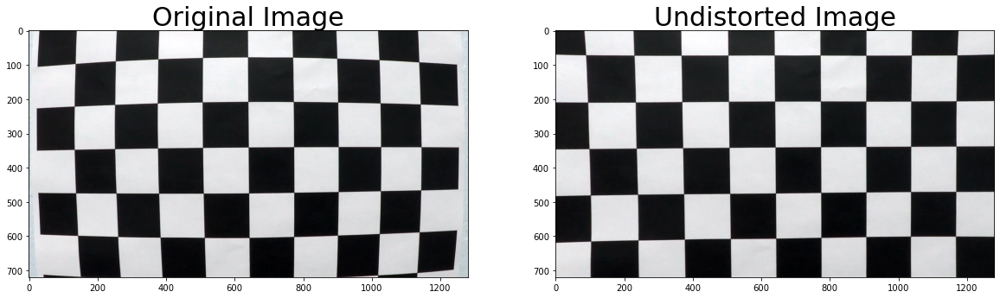

In [3]:
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
#cv2.imwrite('output_images/calibration1_undist.jpg',dst)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

# Pipeline (Test Images)

## Example of a distortion corrected image

In [4]:
def undst(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

Text(0.5, 1.0, 'Undistorted Image')

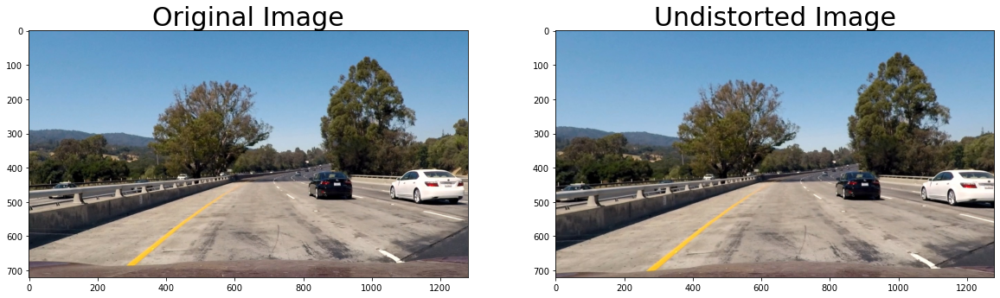

In [5]:
# img = cv2.imread('test_images/test2.jpg')
img = mpimg.imread('test_images/test1.jpg')
dst = undst(img, mtx, dist)
#cv2.imwrite('output_images/test2_undist.jpg', dst)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Define the functions

I will do this a little differently.  I will define function without the threshold and instead output the ab_sobel or sobelx, sobel magnitude or direction or RGB: red, green or blue or HSL: hue, saturation or lightness.  Then a seperate function will create binary image 

In [6]:
def abs_sobel(img, orient='x', sobel_kernel=3):
    
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
            
    if orient == 'y':
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    return scaled_sobel

def mag(img, sobel_kernel=3):
    
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # 3) Calculate the magnitude
    abs_sobelxy = (sobelx**2 + sobely**2)**0.5
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    
    return scaled_sobel

def dir(img, sobel_kernel=3):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    dir = np.arctan2(abs_sobely, abs_sobelx)
    
    return dir

def RGB(img, RGB='R'):
    
    # select color
    if RGB == 'R':
        img_color = img[:,:,0]
    if RGB == 'G':
        img_color = img[:,:,1]
    if RGB == 'B':
        img_color = img[:,:,2]
        
    return img_color
        
def HLS(img, HLS='S'):
    
    # convert to hls
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # select component
    if HLS == 'H':
        img_hls = hls[:,:,0]
        
    if HLS == 'L':
        img_hls = hls[:,:,1]
        
    if HLS == 'S':
        img_hls = hls[:,:,2]
        
    return img_hls

def binary_thresh(img, thresh):
    binary_output = np.zeros_like(img)
    binary_output[(img >= thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

In [7]:
# Read in image and undetort

img = mpimg.imread('test_images/test1.jpg')
dst = undst(img, mtx, dist)

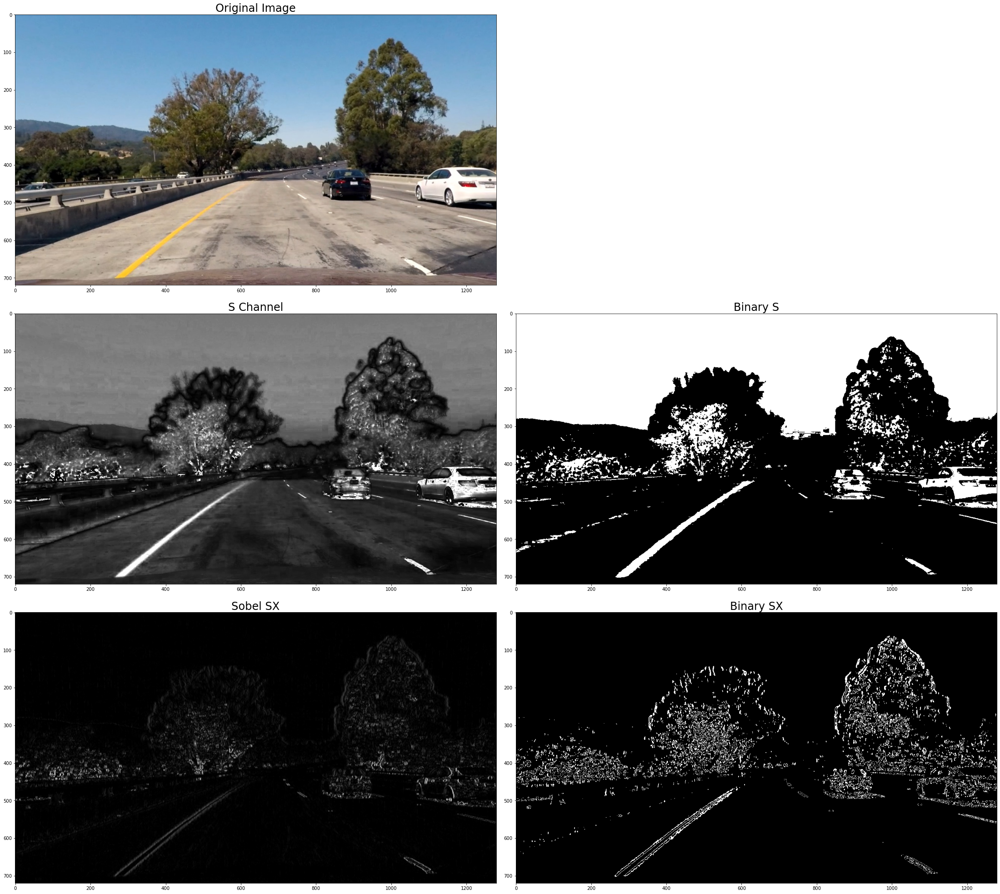

In [8]:
# channel Saturation

thresh_s=(90,255)
thresh_sx=(20, 40)

s_channel = HLS(dst, HLS='S')
binary_s = binary_thresh(s_channel, thresh=thresh_s)
sobel_sx = abs_sobel(s_channel, orient='x', sobel_kernel=5)
binary_sx = binary_thresh(sobel_sx, thresh=thresh_sx)

# Plot the binary result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(30, 30))
ax2.axis('off') 
f.tight_layout()
ax1.imshow(dst)
ax1.set_title('Original Image', fontsize=24)
ax3.imshow(s_channel, cmap='gray')
ax3.set_title('S Channel', fontsize=24)
ax4.imshow(binary_s, cmap='gray')
ax4.set_title('Binary S', fontsize=24)
ax5.imshow(sobel_sx, cmap='gray')
ax5.set_title('Sobel SX', fontsize=24)
ax6.imshow(binary_sx, cmap='gray')
ax6.set_title('Binary SX', fontsize=24)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

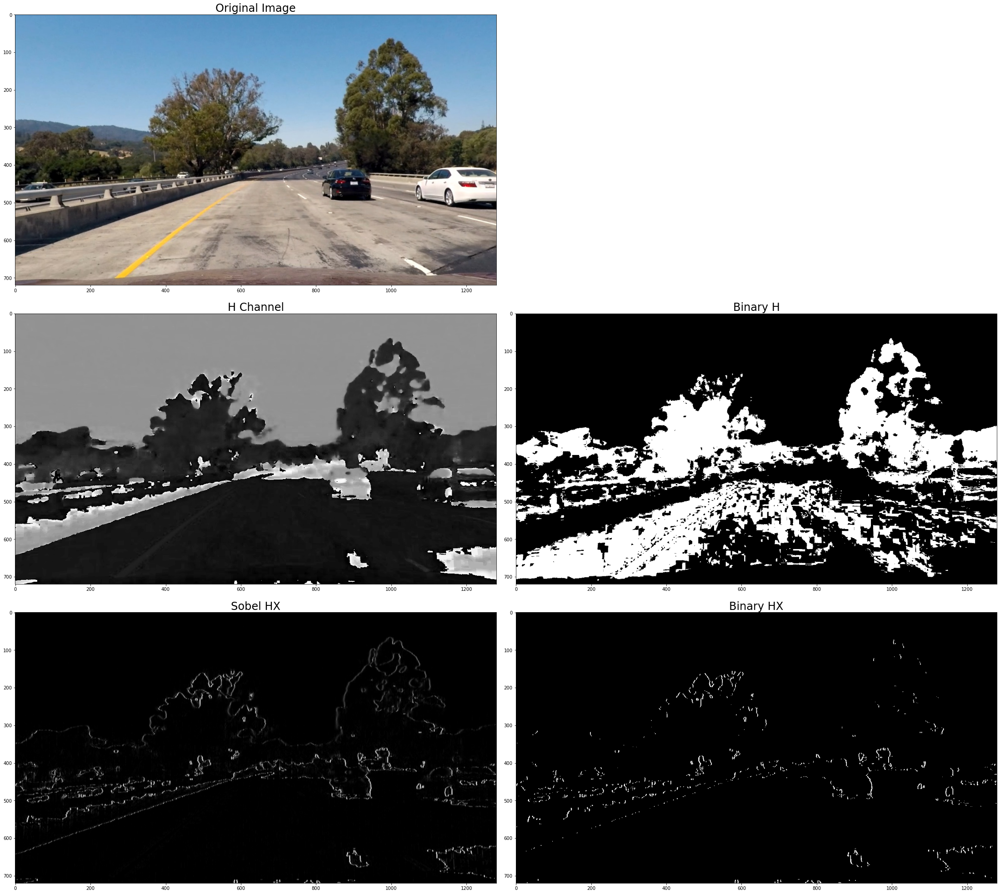

In [9]:
# Channel Hue

thresh_h = (15, 30)
thresh_hx = (100, 255)

h_channel = HLS(dst, HLS='H')
binary_h = binary_thresh(h_channel, thresh=thresh_h)
sobel_hx = abs_sobel(h_channel, orient='x', sobel_kernel=5)
binary_hx = binary_thresh(sobel_hx, thresh=thresh_hx)

# Plot the binary result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(30, 30))
ax2.axis('off') 
f.tight_layout()
ax1.imshow(dst)
ax1.set_title('Original Image', fontsize=24)
ax3.imshow(h_channel, cmap='gray')
ax3.set_title('H Channel', fontsize=24)
ax4.imshow(binary_h, cmap='gray')
ax4.set_title('Binary H', fontsize=24)
ax5.imshow(sobel_hx, cmap='gray')
ax5.set_title('Sobel HX', fontsize=24)
ax6.imshow(binary_hx, cmap='gray')
ax6.set_title('Binary HX', fontsize=24)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

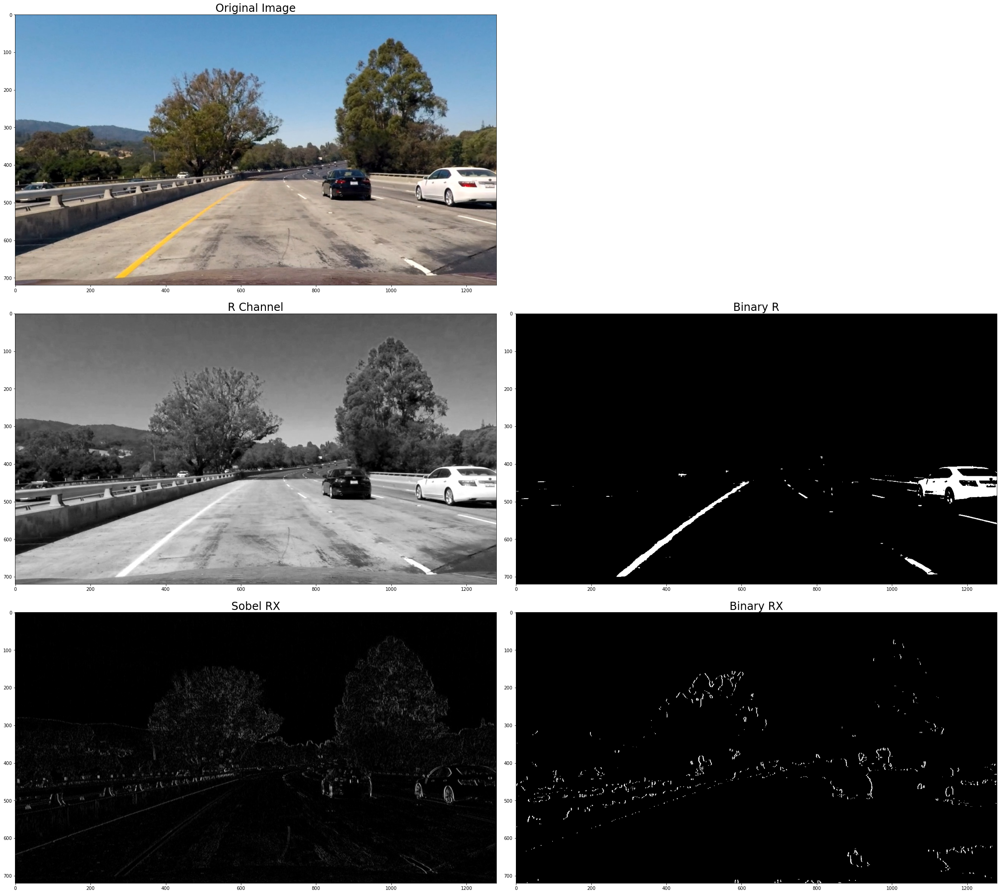

In [10]:
# Channel Red

thresh_r = (220,255)
thresh_rx = (15, 100)

r_channel = RGB(dst, RGB='R')
binary_r = binary_thresh(r_channel, thresh=thresh_r)
sobel_rx = abs_sobel(r_channel, orient='x', sobel_kernel=3)
binary_rx = binary_thresh(sobel_rx, thresh=thresh_rx)

# Plot the binary result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(30, 30))
ax2.axis('off') 
f.tight_layout()
ax1.imshow(dst)
ax1.set_title('Original Image', fontsize=24)
ax3.imshow(r_channel, cmap='gray')
ax3.set_title('R Channel', fontsize=24)
ax4.imshow(binary_r, cmap='gray')
ax4.set_title('Binary R', fontsize=24)
ax5.imshow(sobel_rx, cmap='gray')
ax5.set_title('Sobel RX', fontsize=24)
ax6.imshow(binary_hx, cmap='gray')
ax6.set_title('Binary RX', fontsize=24)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

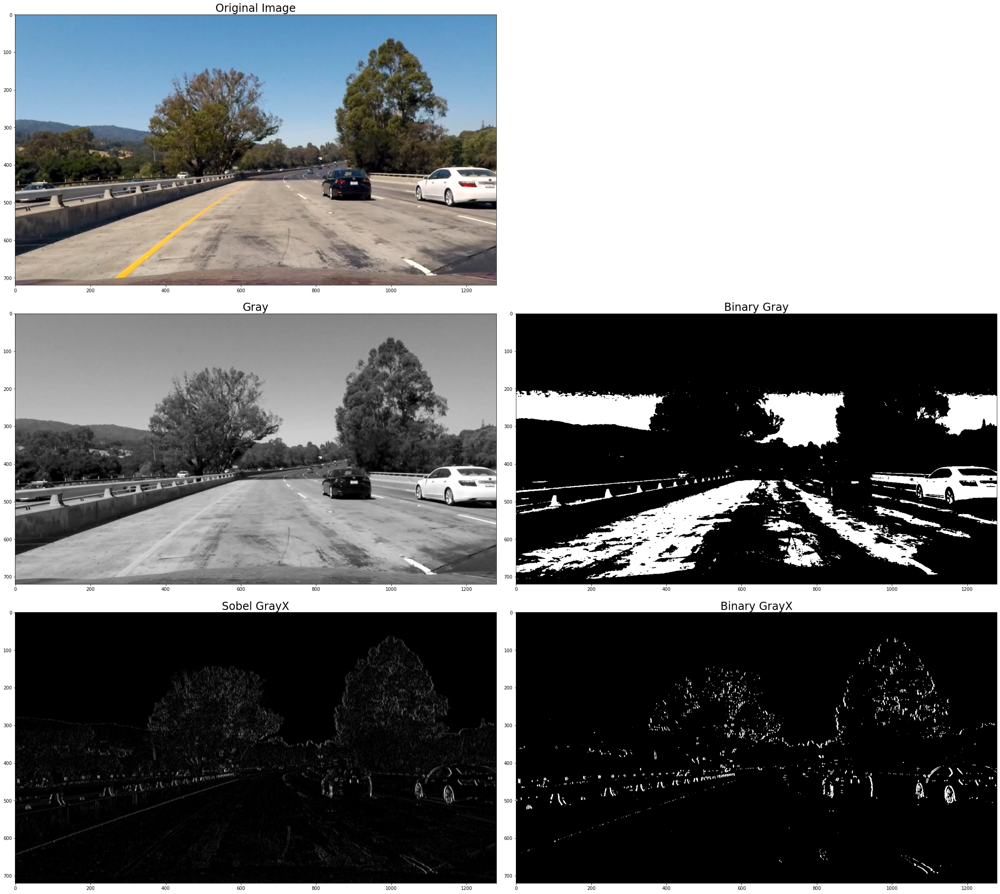

In [11]:
# Channel Gray

thresh_gray = (175,255)
thresh_grayx = (50, 255)

gray = cv2.cvtColor(dst, cv2.COLOR_RGB2GRAY)
binary_gray = binary_thresh(gray, thresh=thresh_gray)
sobel_grayx = abs_sobel(gray, orient='x', sobel_kernel=5)
binary_grayx = binary_thresh(sobel_grayx, thresh=thresh_grayx)

# Plot the binary result
f, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(30, 30))
ax2.axis('off') 
f.tight_layout()
ax1.imshow(dst)
ax1.set_title('Original Image', fontsize=24)
ax3.imshow(gray, cmap='gray')
ax3.set_title('Gray', fontsize=24)
ax4.imshow(binary_gray, cmap='gray')
ax4.set_title('Binary Gray', fontsize=24)
ax5.imshow(sobel_grayx, cmap='gray')
ax5.set_title('Sobel GrayX', fontsize=24)
ax6.imshow(binary_grayx, cmap='gray')
ax6.set_title('Binary GrayX', fontsize=24)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

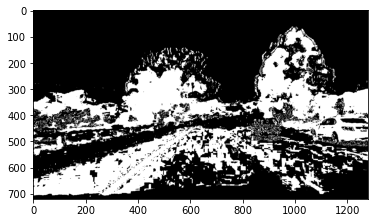

In [12]:
"""
For experimentation - stack binaries and combined binaries.
It didn't seem to work to stack more than two binaries.
This block was the way I experimented with different combinations.
I probably spend too much time doing this and I did this
before the above cells.  I'm leaving in to show how I did
experimented.
"""

binary1 = binary_r
binary2 = binary_sx
binary3 = binary_h
binary4 = binary_grayx

# Combine the binary thresholds
combined_binary = np.zeros_like(binary_r)
combined_binary[(binary1 == 1) | (binary2 == 1) | (binary3 == 1)] = 1

#plt.set_title('Combined color channel and gradient thresholds')
plt.imshow(combined_binary, cmap='gray')

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

## Pipeline
So, after much testing and experimenting with many different combinations of color and gradient, I've settled on using only the S Channel of HLS with sobel gradient and the Red Channel of RGB without gradient.  Adding anything else tends to introduce lots of noise.  The red gives a nice clean reditions of the lanes without using sobel gradient.

In [13]:
def pipeline(dst, thresh_sx=(20, 40), thresh_r = (220, 255)):
    
    #dst = np.copy(dst)
   
    # S channel sobel
    s_channel = HLS(dst, HLS='S')
    sobel_sx = abs_sobel(s_channel, orient='x', sobel_kernel=5)
    binary_sx = binary_thresh(sobel_sx, thresh=thresh_sx)
      
    # r channel no sobel
    r_channel = RGB(dst, RGB='R')
    binary_r = binary_thresh(r_channel, thresh=thresh_r)
    
    # Combine the binary thresholds
    combined_binary = np.zeros_like(binary_r)
    combined_binary[(binary_r == 1) | (binary_sx == 1)] = 1
    return combined_binary

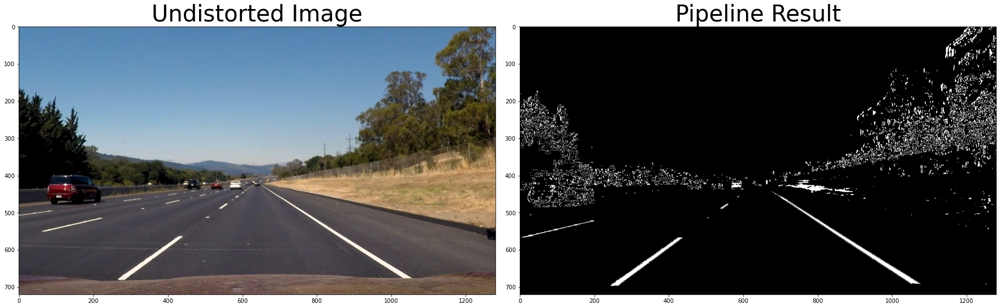

In [14]:
"""
This cell is to read in one image, undistort and run through pipeline.
I save the result to experiment in stages below or include an image in writeup.
"""

# Read in a single image and undetort
img = mpimg.imread('test_images/straight_lines2.jpg')
dst = undst(img, mtx, dist)

# call pipeline
result = pipeline(dst)

# save to output_images
plt.imsave('output_images/straight_lines2_result.jpg', result, cmap='gray')

# Then if you want to see result here uncomment lines below
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Undistorted Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [15]:
import os
test_images = os.listdir("test_images/")
print(test_images)

['test3.jpg', 'straight_lines2.jpg', 'test4.jpg', 'test1.jpg', 'test2.jpg', 'straight_lines1.jpg', 'test5.jpg', 'test6.jpg']


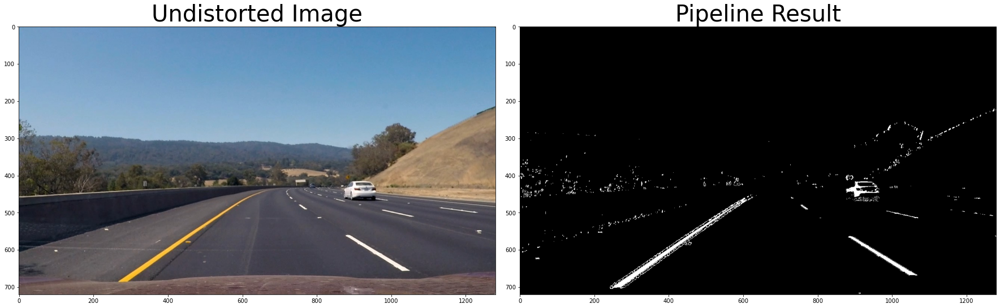

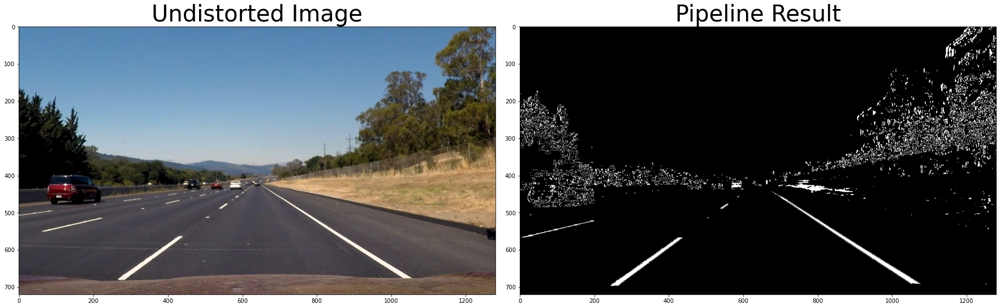

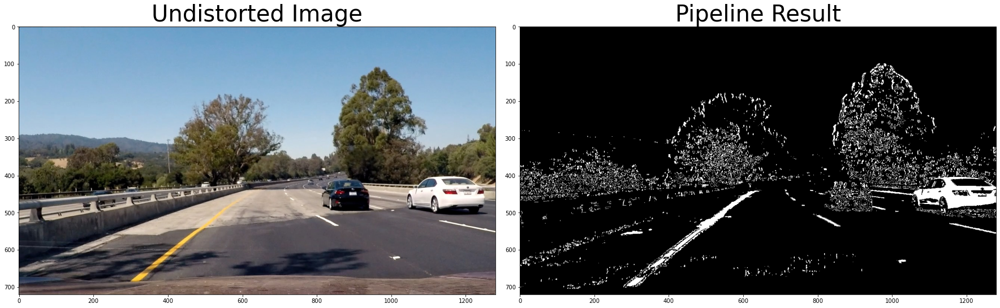

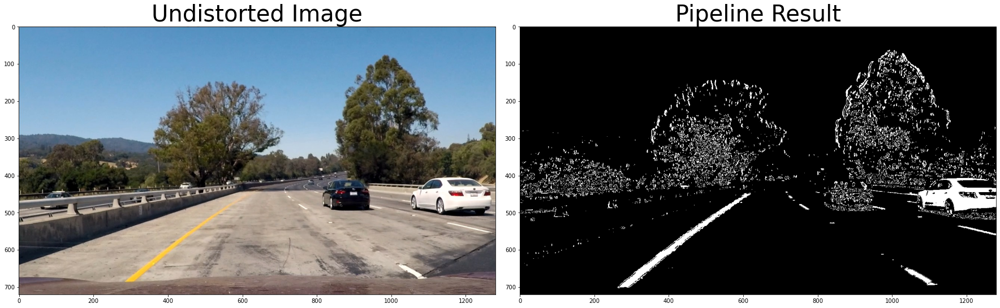

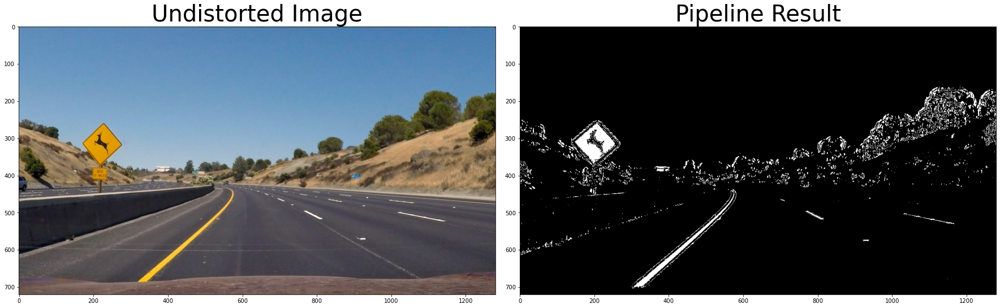

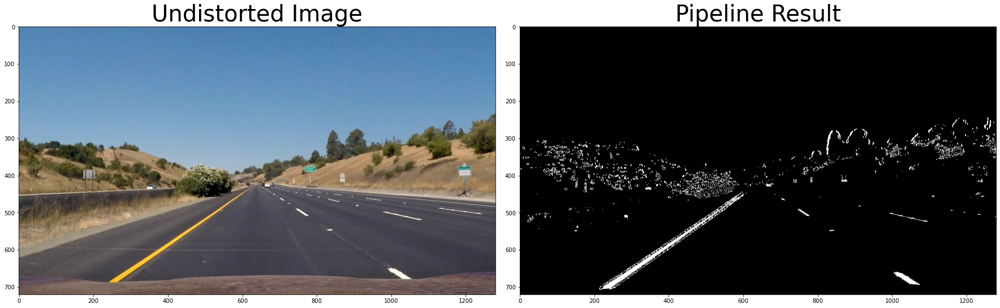

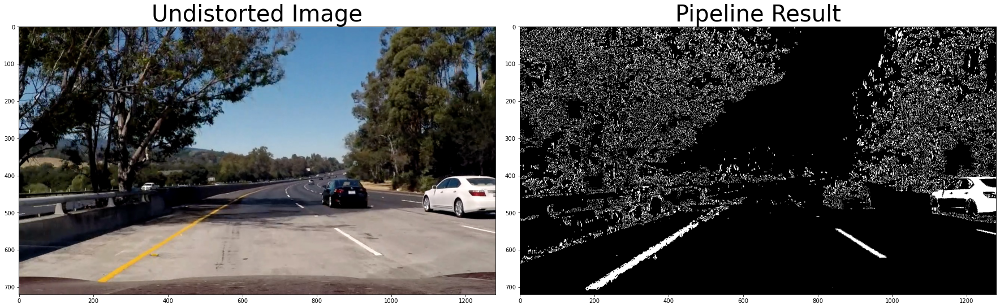

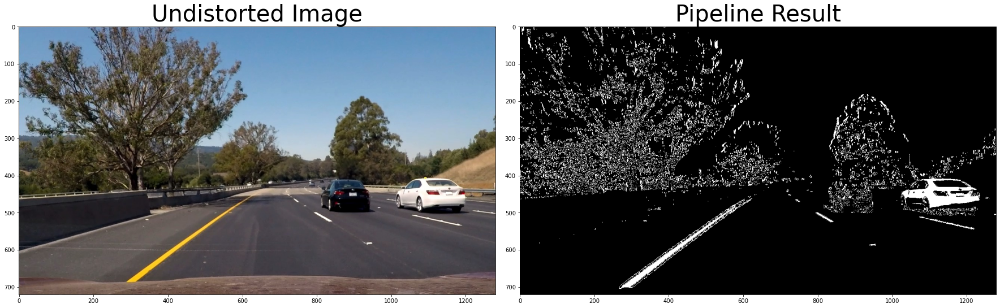

In [16]:
# reads in all the test images and process in pipeline

for i, test_image in enumerate(test_images):
    # read in image and undistort
    img = mpimg.imread('test_images/' + test_image)
    dst = undst(img, mtx, dist)
    
    # call pipeline
    result = pipeline(dst)
    
    # plt.imsave('test_images_output/grayscale' + str(i) + '.jpg', gray, cmap='gray')
    
    # Plot the result
    #plt.figure()
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    
    ax1.imshow(img)
    ax1.set_title('Undistorted Image', fontsize=40)
    
    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


******************************************************************************

# Perpective Transform

In [27]:
def warper(img, src_pts, dst_pts):
    """
    inputs: img: image, src_pts: the source points and dst_pts: desired points or destination points
    In video lectures and examples, dst was used for the deseried points but dst is used above for 
    image that's been undestorted.
    
    output: the warped image: the perpective transform of the image img.  This image will be a birds eye view
    of the road so that the lanes can be mapped.
    """

    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src_pts, dst_pts)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped

In [35]:
!ls test_images

straight_lines1.jpg  test1.jpg	test3.jpg  test5.jpg
straight_lines2.jpg  test2.jpg	test4.jpg  test6.jpg


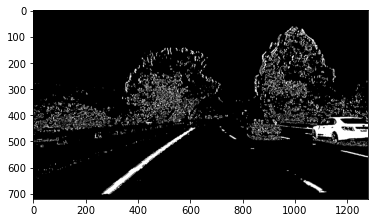

In [36]:
# Read in a single image and undetort
img = mpimg.imread('test_images/test1.jpg')
dst = undst(img, mtx, dist)

# call pipeline
result = pipeline(dst)
plt.imshow(result, cmap = 'gray')

In [37]:
img_size = (result.shape[1], result.shape[0])
img_size

(1280, 720)

In [40]:
src_pts = np.float32([[700, 450], [1050, 680], [220, 680], [580, 450]])
dst_pts = np.float32([[1080, 0], [1080, 720], [200, 720], [200, 0]])

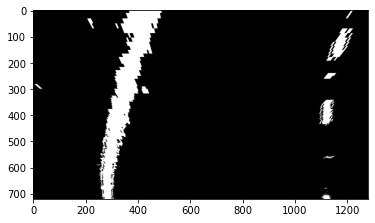

In [41]:
test_warped = warper(result, src_pts, dst_pts)
plt.imshow(test_warped, cmap = 'gray' )